# clck.ru/TtzP2
Перейдите по ссылке -> нажмине правой кнопкой мыши на надпись **"Распознавание дорожных знаков"** -> нажмите на кнопку **"Добавить ярлык на диск"**

# Для работы с ноутбуком создай его копию у себя на диске.
Для этово нажми в **файл -> создать копию на диске**.
Готово, теберь файл есть на твоем гугл диске в папке **Colab Notebooks**.

# Урок цифры на тему "Беспилотный транспорт"

# Что такое исскуственный интеллект?

Искусственный интелект бывает:
- сильный
- слабый

Он применяется во множестве областей:
- финансы 
- тяжелая промышленность
- медицина 
- Музыка
- онлайн и телефонные службы поддержки клиентов
- транспорт 
- распознавание объектов
- Быт
- менеджмент
- управление человеческими ресурсами


# Беспилотный транспорт

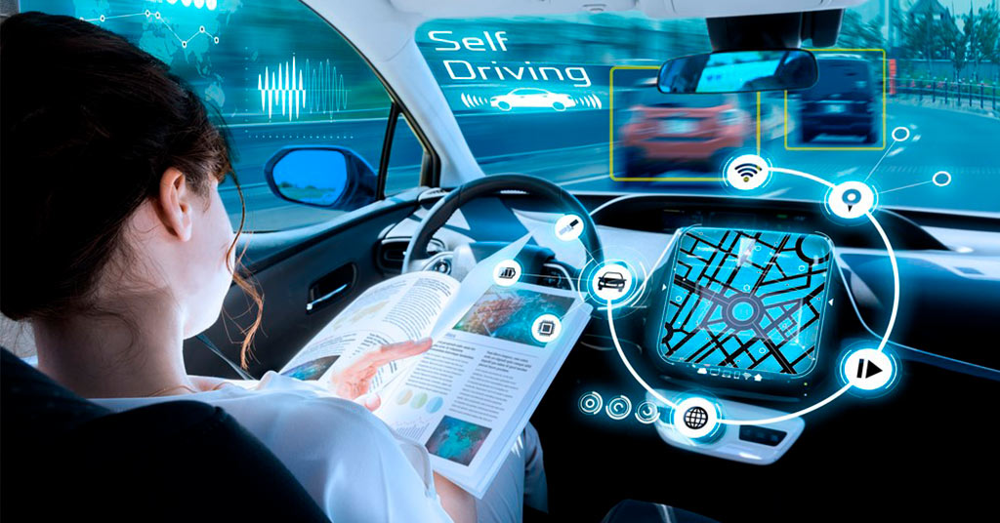

**Какие крупные технологические компании активно работают сегодня над автономным вождением** 
*  (США) cоздала проект автопилотирования Waymo.
*  Yandex (Россия) тестируют беспилотный автомобиль для сервиса Яндекс.Такси
*  IBM (США), которая не славилась разработками в области automotive, *  тоже пошла в беспилотный транспорт, создав совместно с Local Motors автономный микроавтобус Olli. 
*  Intel (США) купила израильскую компанию MobilEye, которая занимается созданием ИИ для транспорта. 
*  Tesla (США) внедрила Autopilot. 
*  General Motors (США) купила стартап Cruise и начала работать над созданием автономной службы такси в Сан-Франциско.
*  Ford (США) купила Argo для разработки автономной службы такси в Майами и Вашингтоне. 
*  Volkswagen (Германия) и Hyundai (Южная Корея) заключили сделку со стартапом Aurora для разработки полностью автономных служб такси.
*  Uber ATG (США) снова тестирует беспилотники и заключила сотрудничество с Toyota для создания системы безопасности.
*  Cognitive Pilot проект C-Pilot.

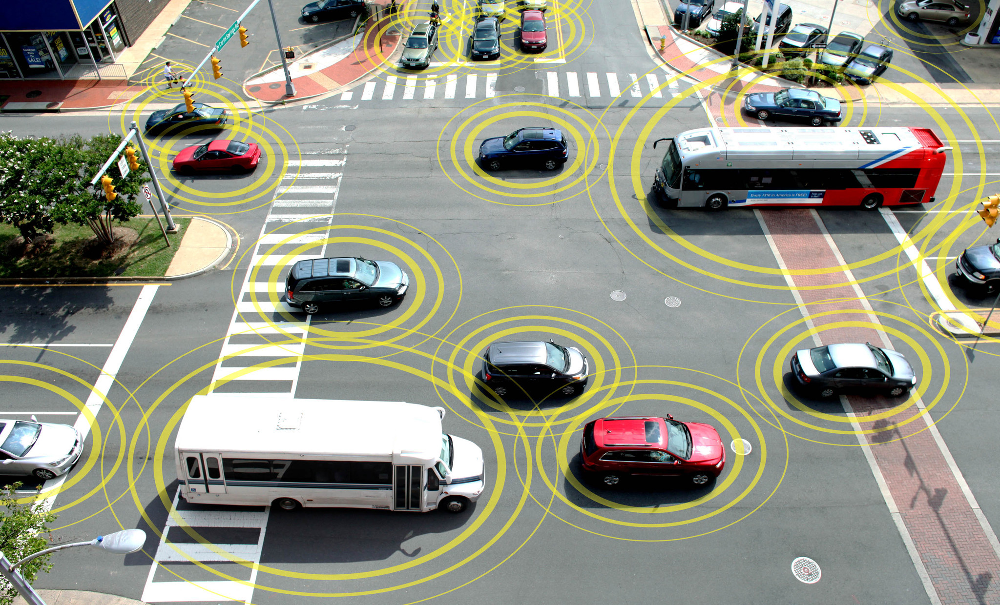

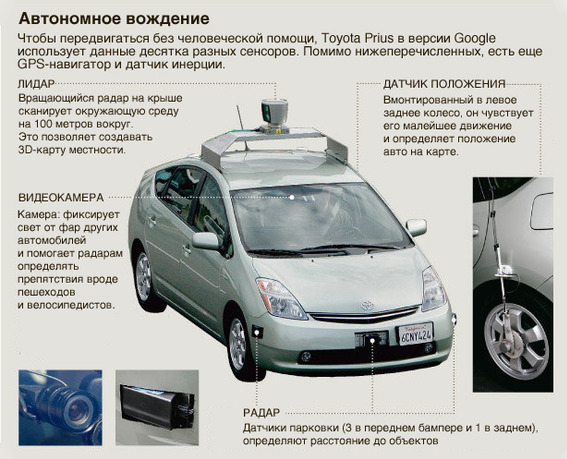

https://youtu.be/FGLPHxkcpRY

https://youtu.be/J9sPYCltNPU

In [5]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from time import time

In [6]:
train_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
        '/content/drive/MyDrive/Распознавание дорожных знаков/Training',
        target_size=(32, 32),
        batch_size=500,
        class_mode='categorical')

test_datagen = ImageDataGenerator(rescale=1/255)

test_generator = test_datagen.flow_from_directory(
        '/content/drive/MyDrive/Распознавание дорожных знаков/Testing',
        target_size=(32, 32),
        batch_size=500,
        class_mode='categorical')

Found 4575 images belonging to 62 classes.
Found 2520 images belonging to 62 classes.


In [ ]:
print(type(train_generator[0][0][0]))

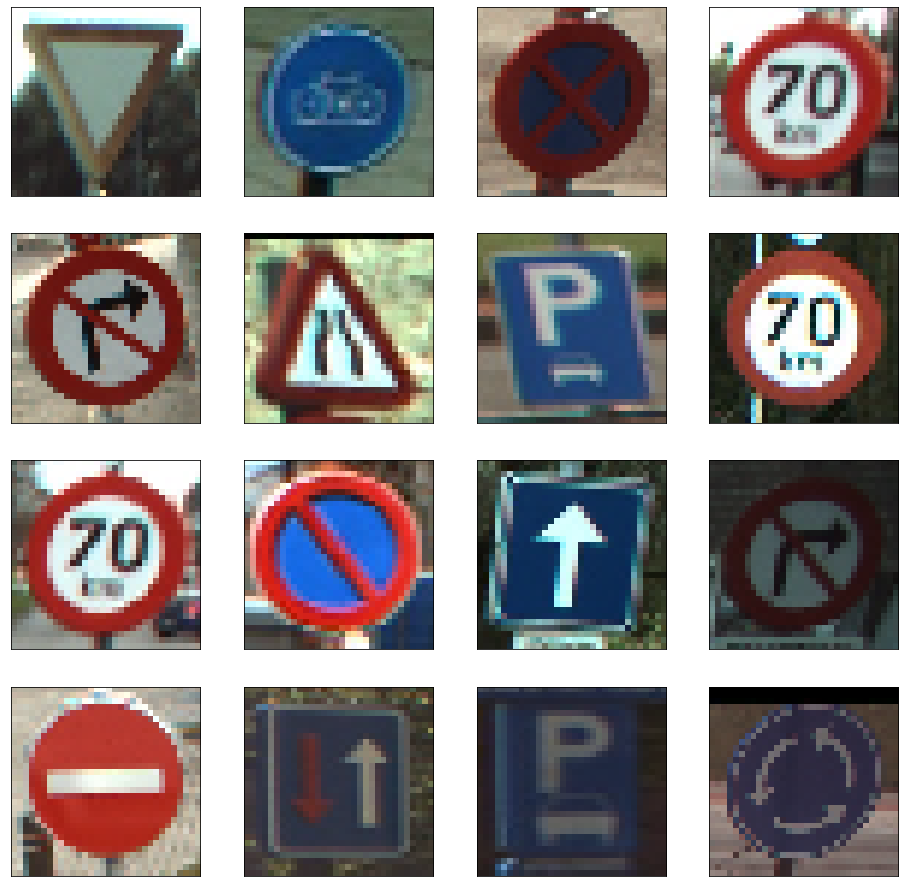

In [7]:
plt.figure(figsize=(16,16))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_generator[0][0][i], cmap=plt.cm.binary)
plt.show()

# Что такое нейронные сети

## Биологический нейрон

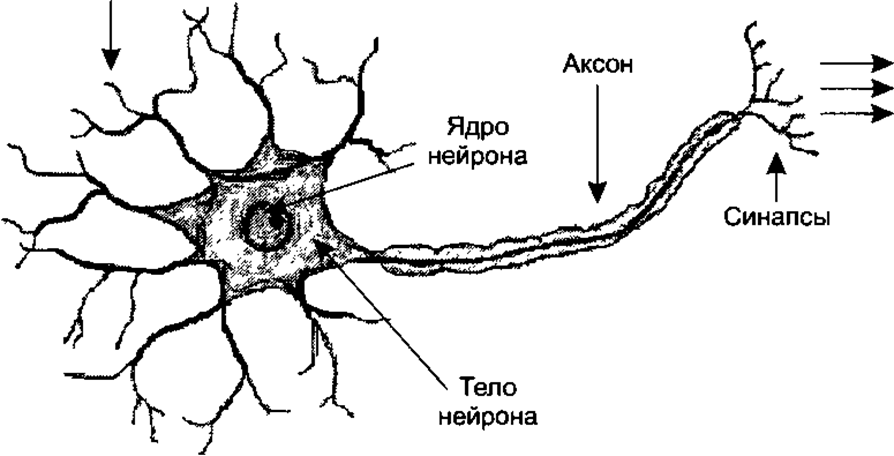

## Математическая модель нейрона







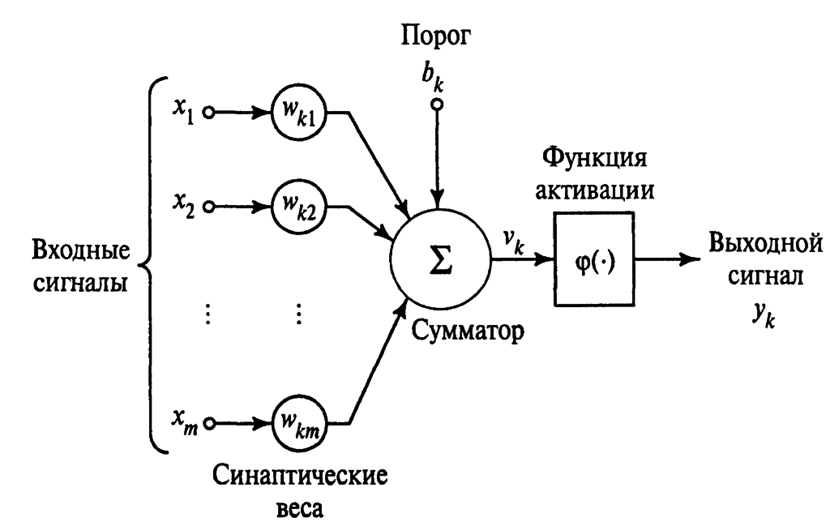

## Нейронная сеть

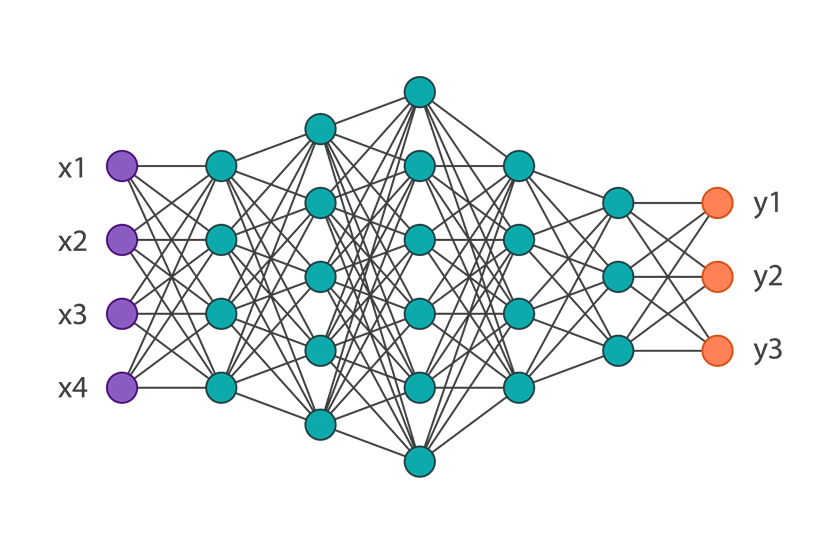

In [8]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(32, 32, 3)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation=tf.nn.relu),
    tf.keras.layers.Dense(62, activation=tf.nn.softmax)
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [9]:
history = model.fit_generator(
          train_generator,
      epochs=10)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
10/10 [==============================] - 463s 45s/step - loss: 4.3369 - accuracy: 0.1272
Epoch 2/10
10/10 [==============================] - 4s 446ms/step - loss: 2.9937 - accuracy: 0.3947
Epoch 3/10
10/10 [==============================] - 4s 443ms/step - loss: 2.1683 - accuracy: 0.5439
Epoch 4/10
10/10 [==============================] - 5s 446ms/step - loss: 1.7302 - accuracy: 0.6389
Epoch 5/10
10/10 [==============================] - 4s 442ms/step - loss: 1.4328 - accuracy: 0.6983
Epoch 6/10
10/10 [==============================] - 4s 442ms/step - loss: 1.2141 - accuracy: 0.7523
Epoch 7/10
10/10 [==============================] - 5s 453ms/step - loss: 1.0286 - accuracy: 0.8087
Epoch 8/10
10/10 [==============================] - 4s 443ms/step - loss: 0.8844 - accuracy: 0.8348
Epoch 9/10
10/10 [==============================] - 4s 483ms/step - loss: 0.8235 - accuracy: 0.8488
Epoch 10/10
10/10 [==============================] - 4s 438ms/step - loss: 0.7179 - accuracy: 0.8683

In [ ]:
model.evaluate(test_generator)

6/6 [==============================] - 407s 81s/step - loss: 0.8949 - accuracy: 0.8381


[0.8949338793754578, 0.8380952477455139]

# Сверточные нейронные сети

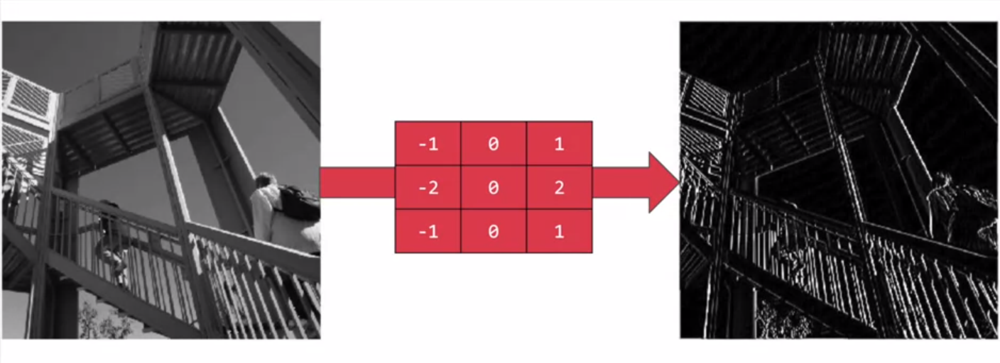

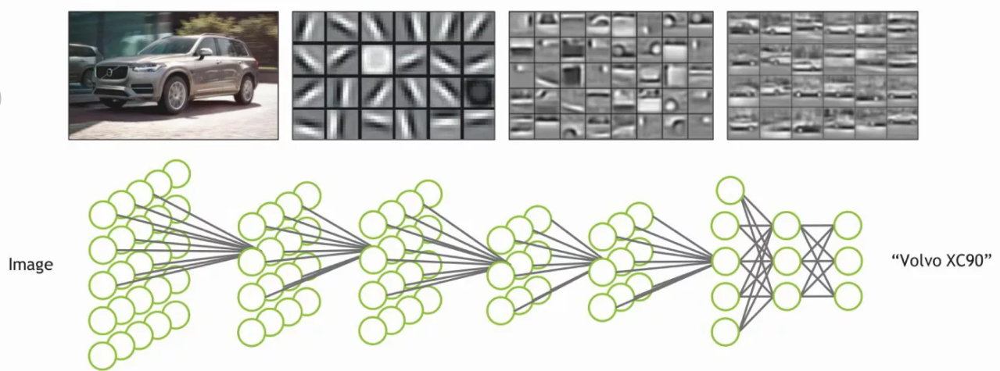

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(32, 32, 3)),
    tf.keras.layers.Conv2D(
        filters=16,
        kernel_size=(5, 5),
        padding='same',
        activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=[2, 2]),
    tf.keras.layers.Conv2D(
        filters=32,
        kernel_size=(5, 5),
        padding='same',
        activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=[2, 2]),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation=tf.nn.relu),
    tf.keras.layers.Dense(62, activation=tf.nn.softmax)
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit_generator(
          train_generator,
      epochs=10)

In [ ]:
model.evaluate(test_generator)

## Для чего это нужно?

https://youtu.be/WLa3pCm3jX8